# Training Kalman Filter for Results

In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from meteo_imp.kalman.fastai import *
from meteo_imp.kalman.filter import *
from meteo_imp.utils import *
from meteo_imp.data import *
from meteo_imp.gaussian import *

from fastai.tabular.learner import *
from fastai.learner import *
from fastai.callback.all import *
from fastcore.foundation import L

from meteo_imp.kalman.fastai import show_results
import pandas as pd
import numpy as np
import torch
import random

from sklearn.decomposition import PCA

In [ ]:
reset_seed()

In [ ]:
haiB = pd.read_parquet(hai_big_path)
hai_eraB = pd.read_parquet(hai_era_big_path)

In [ ]:
list(haiB.columns)

['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN']

## TA - gap 12

In [ ]:
dls_TA = imp_dataloader(haiB, hai_eraB, var_sel = 'TA', block_len=50, gap_len=12, bs=20, control_lags=[1], n_rep=5).cpu()

In [ ]:
model_TA = KalmanFilterSR.init_local_slope_pca(len(haiB.columns),len(haiB.columns), df_pca = haiB, pred_only_gap=True, use_conditional=True)

In [ ]:
save_models_TA = SaveModelsBatch(times_epoch=10)

In [ ]:
items_TA = random.choices(dls_TA.valid.items, k=4)

In [ ]:
learn_TA = Learner(dls_TA, model_TA, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_TA], metrics=rmse_gap)

In [ ]:
learn_TA.fit(1, 1e-3)

epoch,train_loss,valid_loss,rmse_gap,time
0,-17.669978,-18.692597,0.040505,11:47


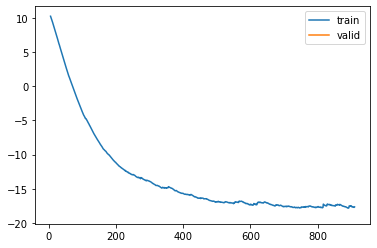

In [ ]:
learn_TA.recorder.plot_loss()

In [ ]:
torch.save(learn_TA.model, "trained_4_feb_TA_gap_12_v1.pickle")

In [ ]:
learn_TA

state,x_0,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,x_11,x_12,x_13
x_0,1.0540,0.0263,-0.1801,0.1166,-0.0537,0.0176,-0.0122,0.9143,0.0358,0.2069,-0.1760,0.0973,0.0417,-0.0181
x_1,0.0331,1.0263,-0.1854,0.1730,-0.0476,0.0026,-0.0084,0.0203,1.0045,0.2047,-0.2114,0.0382,0.1549,-0.0265
x_2,-0.0073,-0.0518,1.1940,-0.1817,0.0451,0.0350,-0.0043,-0.0032,0.0095,0.7757,0.1996,-0.0706,-0.0505,0.0121
x_3,0.0022,0.0489,-0.2066,1.1895,-0.0348,-0.0384,0.0039,0.0109,-0.0043,0.2244,0.7726,0.0558,0.0648,-0.0132
x_4,-0.0512,-0.0249,0.2067,-0.1689,1.0340,-0.0274,0.0076,0.0279,-0.0143,-0.2281,0.2212,0.9361,-0.0667,0.0287
x_5,-0.0319,-0.0366,0.1644,-0.1662,0.0304,0.9821,0.0050,-0.0164,0.0291,-0.2027,0.2111,-0.0685,0.8243,0.0220
x_6,-0.0558,0.0097,0.0369,-0.0054,0.0365,-0.0207,1.0128,-0.0391,0.0098,-0.0321,0.0340,-0.0274,-0.0362,1.1283
x_7,0.0175,-0.0001,-0.0490,0.0358,-0.0187,0.0404,-0.0147,1.0056,-0.0110,-0.1325,0.0999,0.0109,0.0650,0.0072
x_8,0.0198,0.0140,-0.0681,0.0669,-0.0049,0.0069,-0.0147,-0.0261,0.9871,-0.0827,0.0552,0.0196,0.0729,0.0038
x_9,-0.0124,-0.0219,0.0507,-0.0514,0.0192,-0.0041,0.0071,0.0212,0.0110,1.0889,-0.0715,-0.0237,-0.0894,-0.0072


In [ ]:
show_results(learn_TA, items = items_TA, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=4518, shift=15, var_sel=['TA'], gap_len=12), MeteoImpItem(i=3825, shift=5, var_sel=['TA'], gap_len=12), MeteoImpItem(i=3706, shift=-25, var_sel=['TA'], gap_len=12), MeteoImpItem(i=4397, shift=15, var_sel=['TA'], gap_len=12)]


alt.HConcatChart(...)

### TA - 96

after the first trainig fine tune the model for longer gaps 

In [ ]:
dls_TA96 = imp_dataloader(haiB, hai_eraB, var_sel = 'TA', block_len=300, gap_len=96, bs=20, control_lags=[1], n_rep=5).cpu()

In [ ]:
model_TA96 = model_TA.copy()

In [ ]:
save_models_TA96 = SaveModelsBatch(times_epoch=5)

In [ ]:
items_TA96 = random.choices(dls_TA96.valid.items, k=4)

In [ ]:
learn_TA96 = Learner(dls_TA96, model_TA96, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_TA96], metrics=rmse_gap)

In [ ]:
show_results(learn_TA96, items = items_TA96, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=723, shift=90, var_sel=['TA'], gap_len=96), MeteoImpItem(i=718, shift=30, var_sel=['TA'], gap_len=96), MeteoImpItem(i=706, shift=-150, var_sel=['TA'], gap_len=96), MeteoImpItem(i=756, shift=90, var_sel=['TA'], gap_len=96)]


alt.HConcatChart(...)

In [ ]:
learn_TA96.fit(1, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,-61.745678,-63.454943,0.116816,22:50


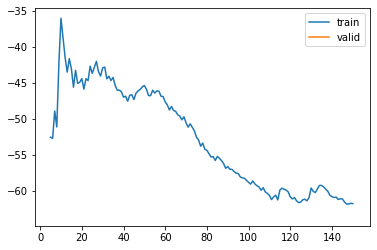

In [ ]:
learn_TA96.recorder.plot_loss()

In [ ]:
show_results(learn_TA96, items = items_TA96, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=723, shift=90, var_sel=['TA'], gap_len=96), MeteoImpItem(i=718, shift=30, var_sel=['TA'], gap_len=96), MeteoImpItem(i=706, shift=-150, var_sel=['TA'], gap_len=96), MeteoImpItem(i=756, shift=90, var_sel=['TA'], gap_len=96)]


alt.HConcatChart(...)

In [ ]:
torch.save(learn_TA96.model, "trained_4_feb_TA_gap_96_v1.pickle")

## All variables - 12 varying 

Model Av (*A*ll *v*arying) all variables with a *v*aring numbers of variables  

In [ ]:
dls_Av = imp_dataloader(haiB, hai_eraB, var_sel = gen_var_sel(list(haiB.columns)), block_len=100, gap_len=12, bs=20, control_lags=[1], n_rep=10).cpu()

In [ ]:
model_Av = model_TA.copy() 

In [ ]:
save_models_Av = SaveModelsBatch(times_epoch=1) # save once per repetition

In [ ]:
items_Av = random.choices(dls_Av.valid.items, k=4)

In [ ]:
learn_Av = Learner(dls_Av, model_Av, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_Av], metrics=rmse_gap)

In [ ]:
learn_Av.fit(2, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,27.495375,25.322661,0.489185,26:10
1,14.247212,13.797795,0.408078,26:31


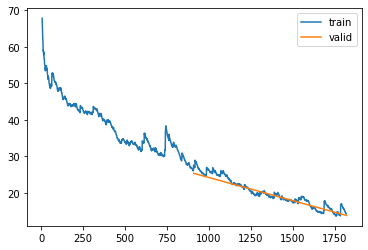

In [ ]:
learn_Av.recorder.plot_loss()

In [ ]:
with with_settings(learn_Av.model, use_conditional =False): #speed up training
    learn_Av.fit(2, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,7.901138,7.892225,0.360798,23:14
1,2.295464,4.088155,0.336661,23:39


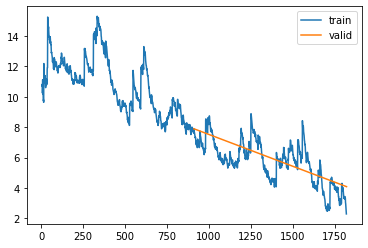

In [ ]:
learn_Av.recorder.plot_loss()

In [ ]:
torch.save(learn_Av.model, "trained_4_feb_All_gap_varying_12_v1.pickle")

In [ ]:
show_results(learn_Av, items=items_Av, control_map=control_map)

[MeteoImpItem(i=1867, shift=0, var_sel=['TA'], gap_len=12), MeteoImpItem(i=2001, shift=-50, var_sel=['PA', 'VPD', 'LW_IN', 'TA', 'WS'], gap_len=12), MeteoImpItem(i=1960, shift=-40, var_sel=['TA', 'PA', 'P', 'SW_IN', 'VPD', 'WS', 'LW_IN'], gap_len=12), MeteoImpItem(i=2163, shift=30, var_sel=['TA'], gap_len=12)]


alt.HConcatChart(...)

In [ ]:
with with_settings(learn_Av.model, use_conditional =False): #speed up training
    learn_Av.fit(2, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,3.646232,1.610648,0.321632,24:10
1,-1.735119,-0.024182,0.312380,24:34


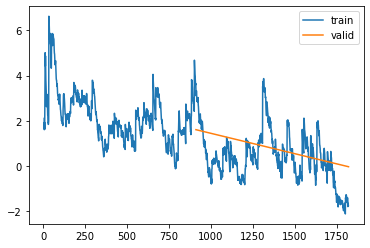

In [ ]:
learn_Av.recorder.plot_loss()

In [ ]:
torch.save(learn_Av.model, "trained_4_feb_All_gap_varying_12_v2.pickle")

In [ ]:
show_results(learn_Av, items=items_Av, control_map=control_map)

[MeteoImpItem(i=1867, shift=0, var_sel=['TA'], gap_len=12), MeteoImpItem(i=2001, shift=-50, var_sel=['PA', 'VPD', 'LW_IN', 'TA', 'WS'], gap_len=12), MeteoImpItem(i=1960, shift=-40, var_sel=['TA', 'PA', 'P', 'SW_IN', 'VPD', 'WS', 'LW_IN'], gap_len=12), MeteoImpItem(i=2163, shift=30, var_sel=['TA'], gap_len=12)]


alt.HConcatChart(...)

## All variables - 12 all gap

In [ ]:
dls_Aa = imp_dataloader(haiB, hai_eraB, var_sel = list(haiB.columns), block_len=70, gap_len=12, bs=20, control_lags=[1], n_rep=10).cpu()

In [ ]:
model_Aa = model_Av.copy() 
model_Aa.use_conditional = False

In [ ]:
save_models_Aa = SaveModelsBatch(times_epoch=1) # save once per repetition

In [ ]:
items_Aa = random.choices(dls_Aa.valid.items, k=4)

In [ ]:
learn_Aa = Learner(dls_Aa, model_Aa, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_Aa], metrics=rmse_gap)

In [ ]:
learn_Aa.fit(2, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,-3.860496,-2.163738,0.297889,32:06
1,-3.991504,-3.813984,0.290560,32:34


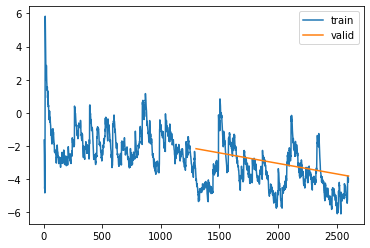

In [ ]:
learn_Aa.recorder.plot_loss()

In [ ]:
torch.save(learn_Aa.model, "trained_4_feb_All_gap_all_12_v1.pickle")

In [ ]:
show_results(learn_Aa, items=items_Aa, control_map=control_map)

[MeteoImpItem(i=3064, shift=7, var_sel=['P', 'VPD', 'WS', 'SW_IN', 'PA', 'TA'], gap_len=12), MeteoImpItem(i=2776, shift=7, var_sel=['VPD', 'PA', 'SW_IN', 'WS'], gap_len=12), MeteoImpItem(i=3253, shift=-21, var_sel=['VPD', 'SW_IN'], gap_len=12), MeteoImpItem(i=2716, shift=14, var_sel=['SW_IN'], gap_len=12)]


alt.HConcatChart(...)

## SW_IN - gap 12

In [ ]:
dls_SW_IN = imp_dataloader(haiB, hai_eraB, var_sel = 'SW_IN', block_len=50, gap_len=12, bs=20, control_lags=[1], n_rep=5).cpu()

In [ ]:
model_SW_IN = model_Av.copy()

In [ ]:
save_models_SW_IN = SaveModelsBatch(times_epoch=10)

In [ ]:
items_SW_IN = random.choices(dls_SW_IN.valid.items, k=4)

In [ ]:
learn_SW_IN = Learner(dls_SW_IN, model_SW_IN, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_SW_IN], metrics=rmse_gap)

In [ ]:
learn_SW_IN.fit(3, 5e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,1.571930,2.161097,0.229693,12:20
1,1.701283,1.642652,0.216893,12:26
2,1.033681,1.752522,0.214100,12:50


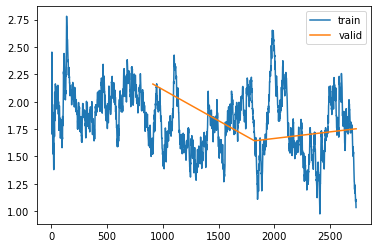

In [ ]:
learn_SW_IN.recorder.plot_loss()

In [ ]:
torch.save(learn_SW_IN.model, "trained_4_feb_SW_IN_gap_12_v1.pickle")

In [ ]:
learn_SW_IN

state,x_0,x_1,x_2,x_3,x_4,x_5,x_6,x_7,x_8,x_9,x_10,x_11,x_12,x_13
x_0,1.2092,0.0099,-0.1905,0.0169,-0.0984,-0.0086,-0.0375,0.8756,0.0942,0.2282,-0.1515,-0.0565,-0.0419,-0.0731
x_1,0.0250,1.1628,-0.1911,0.1139,-0.0933,-0.0061,-0.0202,0.0043,0.8123,0.1668,-0.1492,0.0625,0.0224,0.0082
x_2,0.0058,-0.0328,1.2095,-0.1337,0.0424,0.0783,0.0067,-0.0326,-0.0048,0.6848,0.1042,-0.0030,-0.0034,0.0172
x_3,0.0506,0.0430,-0.1128,1.1909,-0.0675,-0.0662,0.0139,0.0205,0.0210,0.1381,0.6624,0.0020,0.0031,-0.0198
x_4,-0.1150,-0.0565,0.1214,-0.1329,1.1548,0.0006,0.0438,0.0248,0.0160,-0.1514,0.2205,0.7190,-0.0158,-0.0161
x_5,-0.0051,-0.0034,0.1459,-0.1069,0.0482,1.0111,0.0273,0.1421,-0.0900,-0.1165,0.1743,-0.0579,0.6217,0.0555
x_6,-0.1867,0.0374,0.0283,0.0998,0.1161,-0.1061,1.0440,0.0212,-0.1477,0.0734,-0.0844,0.0142,0.1911,1.1859
x_7,0.1577,-0.0190,-0.0549,0.0844,0.0527,0.0865,0.0427,0.9606,-0.0319,-0.1238,0.0597,0.0510,0.0823,0.0125
x_8,0.0562,0.1505,-0.0321,0.0300,-0.0300,0.0235,-0.0623,-0.0047,0.9781,-0.0897,0.0459,0.0068,0.0778,0.0129
x_9,0.0766,-0.0076,0.1531,-0.0059,-0.0445,-0.0611,0.0210,-0.0223,-0.0109,1.1227,-0.0934,0.0140,-0.0822,-0.0101


In [ ]:
show_results(learn_SW_IN, items = items_SW_IN, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=3927, shift=-15, var_sel=['SW_IN'], gap_len=12), MeteoImpItem(i=4045, shift=-5, var_sel=['SW_IN'], gap_len=12), MeteoImpItem(i=4390, shift=-25, var_sel=['SW_IN'], gap_len=12), MeteoImpItem(i=3968, shift=-25, var_sel=['SW_IN'], gap_len=12)]


alt.HConcatChart(...)

### SW_IN - 96

after the first trainig fine tune the model for longer gaps 

In [ ]:
dls_SW_IN96 = imp_dataloader(haiB, hai_eraB, var_sel = 'SW_IN', block_len=300, gap_len=96, bs=20, control_lags=[1], n_rep=5).cpu()

In [ ]:
model_SW_IN96 = model_SW_IN.copy()

In [ ]:
save_models_SW_IN96 = SaveModelsBatch(times_epoch=5)

In [ ]:
items_SW_IN96 = random.choices(dls_SW_IN96.valid.items, k=4)

In [ ]:
learn_SW_IN96 = Learner(dls_SW_IN96, model_SW_IN96, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_SW_IN96], metrics=rmse_gap)

In [ ]:
show_results(learn_SW_IN96, items = items_SW_IN96, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=660, shift=30, var_sel=['SW_IN'], gap_len=96), MeteoImpItem(i=684, shift=30, var_sel=['SW_IN'], gap_len=96), MeteoImpItem(i=684, shift=90, var_sel=['SW_IN'], gap_len=96), MeteoImpItem(i=632, shift=-90, var_sel=['SW_IN'], gap_len=96)]


alt.HConcatChart(...)

In [ ]:
learn_SW_IN96.fit(2, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,23.111818,21.649970,0.277776,22:20
1,23.287213,21.537204,0.277468,22:06


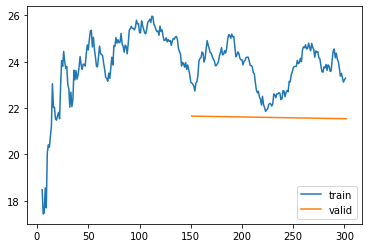

In [ ]:
learn_SW_IN96.recorder.plot_loss()

In [ ]:
show_results(learn_SW_IN96, items = items_SW_IN96, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=660, shift=30, var_sel=['SW_IN'], gap_len=96), MeteoImpItem(i=684, shift=30, var_sel=['SW_IN'], gap_len=96), MeteoImpItem(i=684, shift=90, var_sel=['SW_IN'], gap_len=96), MeteoImpItem(i=632, shift=-90, var_sel=['SW_IN'], gap_len=96)]


alt.HConcatChart(...)

In [ ]:
torch.save(learn_SW_IN96.model, "trained_4_feb_SW_IN_gap_96_v1.pickle")

## Control

### No Control - TA 12

In [ ]:
dls_TA_nc = imp_dataloader(haiB, hai_eraB, var_sel = 'TA', block_len=50, gap_len=12, bs=20, control_lags=[1], n_rep=1).cpu()

In [ ]:
model_TA_nc = model_TA96.copy()
model_TA_nc.use_control = False

In [ ]:
save_models_TA_nc = SaveModelsBatch(times_epoch=2)

In [ ]:
items_TA_nc = random.choices(dls_TA_nc.valid.items, k=4)

In [ ]:
learn_TA_nc = Learner(dls_TA_nc, model_TA_nc, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_TA_nc], metrics=rmse_gap)

In [ ]:
learn_TA_nc.fit(1, 5e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,-18.464700,-18.834046,0.040957,02:33


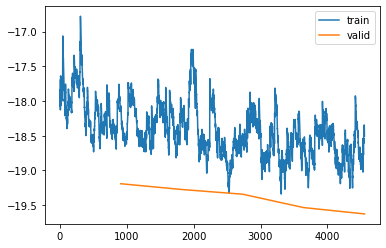

In [ ]:
learn_TA_nc.recorder.plot_loss()

In [ ]:
torch.save(learn_TA_nc.model, "trained_4_feb_TA_gap_12_no_control_v1.pickle")

In [ ]:
show_results(learn_TA_nc, items = items_TA_nc, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=3919, shift=15, var_sel=['TA'], gap_len=12), MeteoImpItem(i=4068, shift=15, var_sel=['TA'], gap_len=12), MeteoImpItem(i=4114, shift=-15, var_sel=['TA'], gap_len=12), MeteoImpItem(i=4180, shift=-5, var_sel=['TA'], gap_len=12)]


alt.HConcatChart(...)

### No Control - TA 96

In [ ]:
dls_TA96_nc = imp_dataloader(haiB, hai_eraB, var_sel = 'TA', block_len=300, gap_len=96, bs=20, control_lags=[1], n_rep=5).cpu()

In [ ]:
model_TA96_nc = model_TA_nc.copy()
model_TA96_nc.use_control = False

/home/simone/anaconda3/envs/data-science/lib/python3.10/site-packages/fastai/callback/core.py:69: UserWarning: You are shadowing an attribute (__class__) that exists in the learner. Use `self.learn.__class__` to avoid this
  warn(f"You are shadowing an attribute ({name}) that exists in the learner. Use `self.learn.{name}` to avoid this")


In [ ]:
save_models_TA96_nc = SaveModelsBatch(times_epoch=2)

In [ ]:
items_TA96_nc = random.choices(dls_TA96_nc.valid.items, k=4)

In [ ]:
learn_TA96_nc = Learner(dls_TA96_nc, model_TA96_nc, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_TA96_nc], metrics=rmse_gap)

In [ ]:
show_results(learn_TA96_nc, items = items_TA96_nc, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=757, shift=-90, var_sel=['TA'], gap_len=96), MeteoImpItem(i=711, shift=-90, var_sel=['TA'], gap_len=96), MeteoImpItem(i=743, shift=-150, var_sel=['TA'], gap_len=96), MeteoImpItem(i=625, shift=-30, var_sel=['TA'], gap_len=96)]


alt.HConcatChart(...)

In [ ]:
learn_TA96_nc.fit(2, 5e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,-16.875112,-38.792134,0.158970,24:20
1,-36.028650,-42.915542,0.153475,22:35


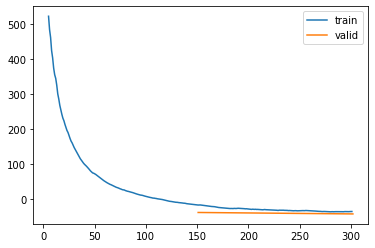

In [ ]:
learn_TA96_nc.recorder.plot_loss()

In [ ]:
torch.save(learn_TA96_nc.model, "trained_4_feb_TA_gap_96_no_control_v1.pickle")

In [ ]:
show_results(learn_TA96_nc, items = items_TA96_nc, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=757, shift=-90, var_sel=['TA'], gap_len=96), MeteoImpItem(i=711, shift=-90, var_sel=['TA'], gap_len=96), MeteoImpItem(i=743, shift=-150, var_sel=['TA'], gap_len=96), MeteoImpItem(i=625, shift=-30, var_sel=['TA'], gap_len=96)]


alt.HConcatChart(...)

### No Control - All variables - 12 all gap

In [ ]:
dls_Aa96_nc = imp_dataloader(haiB, hai_eraB, var_sel = list(haiB.columns), block_len=70, gap_len=12, bs=20, control_lags=[1], n_rep=2).cpu()

In [ ]:
model_Aa96_nc = model_Aa96.copy() 
model_Aa96_nc.use_control = False

In [ ]:
save_models_Aa96_nc= SaveModelsBatch(times_epoch=1) # save once per repetition

In [ ]:
items_Aa96_nc  = random.choices(dls_Aa96_nc.valid.items, k=4)

In [ ]:
learn_Aa96_nc = Learner(dls_Aa96_nc, model_Aa96_nc, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_Aa96_nc], metrics=rmse_gap)

In [ ]:
show_results(learn_Aa96_nc, items=items_Aa96_nc, control_map=control_map)

[MeteoImpItem(i=3064, shift=7, var_sel=['P', 'VPD', 'WS', 'SW_IN', 'PA', 'TA'], gap_len=12), MeteoImpItem(i=2776, shift=7, var_sel=['VPD', 'PA', 'SW_IN', 'WS'], gap_len=12), MeteoImpItem(i=3253, shift=-21, var_sel=['VPD', 'SW_IN'], gap_len=12), MeteoImpItem(i=2716, shift=14, var_sel=['SW_IN'], gap_len=12)]


alt.HConcatChart(...)

In [ ]:
learn_Aa96_nc.fit(1, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,38.744036,30.468859,0.436350,03:39


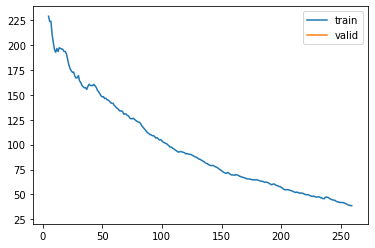

In [ ]:
learn_Aa96_nc.recorder.plot_loss()

In [ ]:
learn_Aa96_nc.fit(1, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,12.341979,12.002963,0.392356,03:51


In [ ]:
learn_Aa96_nc.fit(1, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,5.277773,4.664958,0.367391,37:31


In [ ]:
learn_Aa96_nc.fit(1, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,1.912588,0.122255,0.352851,04:10


In [ ]:
learn_Aa96_nc.fit(1, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,-2.542222,-3.259210,0.344657,03:51


In [ ]:
learn_Aa96_nc.fit(1, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,-5.897630,-5.467389,0.339895,04:01


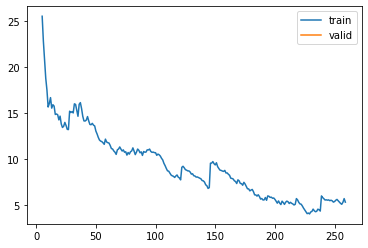

In [ ]:
learn_Aa96_nc.recorder.plot_loss()

In [ ]:
torch.save(learn_Aa96_nc.model, "trained_4_feb_All_gap_all_12_no_control_v1.pickle")

In [ ]:
show_results(learn_Aa96_nc, items=items_Aa96_nc, control_map=control_map)

[MeteoImpItem(i=3077, shift=-35, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=12), MeteoImpItem(i=3195, shift=-35, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=12), MeteoImpItem(i=3230, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=12), MeteoImpItem(i=2910, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=12)]


alt.HConcatChart(...)

### No Control - All variables - 24 all gap

In [ ]:
dls_Aa24_nc = imp_dataloader(haiB, hai_eraB, var_sel = list(haiB.columns), block_len=150, gap_len=24, bs=20, control_lags=[1], n_rep=2).cpu()

In [ ]:
model_Aa24_nc = model_Aa_nc.copy() 
model_Aa24_nc.use_control = False

In [ ]:
save_models_Aa24_nc= SaveModelsBatch(times_epoch=1) # save once per repetition

In [ ]:
items_Aa24_nc  = random.choices(dls_Aa24_nc.valid.items, k=4)

In [ ]:
learn_Aa24_nc = Learner(dls_Aa24_nc, model_Aa24_nc, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_Aa24_nc], metrics=rmse_gap)

In [ ]:
show_results(learn_Aa24_nc, items=items_Aa24_nc, control_map=control_map)

[MeteoImpItem(i=1439, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=24), MeteoImpItem(i=1222, shift=-75, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=24), MeteoImpItem(i=1376, shift=-75, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=24), MeteoImpItem(i=1364, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=24)]


alt.HConcatChart(...)

In [ ]:
learn_Aa24_nc.fit(5, 3e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,41.673347,42.895707,0.457301,04:47
1,42.247850,40.339583,0.451268,04:37
2,34.196943,38.366525,0.445817,04:47
3,32.270157,36.991478,0.443363,04:42
4,33.566557,35.243634,0.436804,04:54


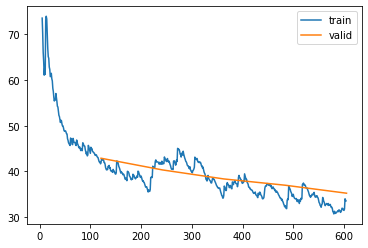

In [ ]:
learn_Aa24_nc.recorder.plot_loss()

In [ ]:
torch.save(learn_Aa24_nc.model, "trained_4_feb_All_gap_all_24_no_control_v1.pickle")

In [ ]:
show_results(learn_Aa24_nc, items=items_Aa24_nc, control_map=control_map)

[MeteoImpItem(i=1439, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=24), MeteoImpItem(i=1222, shift=-75, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=24), MeteoImpItem(i=1376, shift=-75, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=24), MeteoImpItem(i=1364, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=24)]


alt.HConcatChart(...)

### No Control - All variables - 24 varying

In [ ]:
dls_Av24_nc = imp_dataloader(haiB, hai_eraB, var_sel = gen_var_sel(list(haiB.columns)), block_len=150, gap_len=24, bs=20, control_lags=[1], n_rep=2).cpu()

In [ ]:
model_Av24_nc = model_Aa24_nc.copy() 
model_Av24_nc.use_control = False

In [ ]:
save_models_Av24_nc= SaveModelsBatch(times_epoch=1) # save once per repetition

In [ ]:
items_Av24_nc  = random.choices(dls_Av24_nc.valid.items, k=4)

In [ ]:
learn_Av24_nc = Learner(dls_Av24_nc, model_Av24_nc, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_Av24_nc], metrics=rmse_gap)

In [ ]:
show_results(learn_Av24_nc, items=items_Av24_nc, control_map=control_map)

[MeteoImpItem(i=1438, shift=0, var_sel=['SW_IN', 'TA', 'PA', 'LW_IN', 'VPD', 'WS', 'P'], gap_len=24), MeteoImpItem(i=1275, shift=0, var_sel=['WS', 'SW_IN', 'TA', 'LW_IN'], gap_len=24), MeteoImpItem(i=1316, shift=-75, var_sel=['VPD', 'WS', 'TA', 'P', 'LW_IN', 'PA', 'SW_IN'], gap_len=24), MeteoImpItem(i=1273, shift=-75, var_sel=['P', 'TA', 'SW_IN', 'LW_IN', 'WS'], gap_len=24)]


alt.HConcatChart(...)

In [ ]:
learn_Av24_nc.fit(2, 3e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,18.450633,16.309334,0.376543,06:58
1,15.670756,16.164595,0.374336,06:24


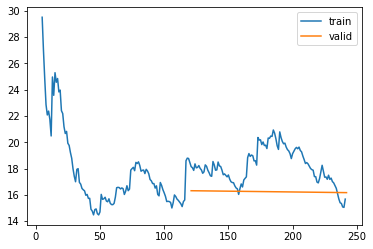

In [ ]:
learn_Av24_nc.recorder.plot_loss()

In [ ]:
torch.save(learn_Av24_nc.model, "trained_4_feb_All_gap_varying_24_no_control_v1.pickle")

In [ ]:
show_results(learn_Av24_nc, items=items_Av24_nc, control_map=control_map)

### No Control - All variables - 36 all gap

In [ ]:
dls_Aa36_nc = imp_dataloader(haiB, hai_eraB, var_sel = list(haiB.columns), block_len=150, gap_len=36, bs=20, control_lags=[1], n_rep=2).cpu()

In [ ]:
model_Aa36_nc = model_Aa24_nc.copy() 
model_Aa36_nc.use_control = False

In [ ]:
save_models_Aa36_nc= SaveModelsBatch(times_epoch=1) # save once per repetition

In [ ]:
items_Aa36_nc  = random.choices(dls_Aa36_nc.valid.items, k=4)

In [ ]:
learn_Aa36_nc = Learner(dls_Aa36_nc, model_Aa36_nc, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_Aa36_nc], metrics=rmse_gap)

In [ ]:
show_results(learn_Aa36_nc, items=items_Aa36_nc, control_map=control_map)

[MeteoImpItem(i=1384, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=36), MeteoImpItem(i=1362, shift=-75, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=36), MeteoImpItem(i=1410, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=36), MeteoImpItem(i=1505, shift=-75, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=36)]


alt.HConcatChart(...)

In [ ]:
learn_Aa36_nc.fit(2, 3e-4)

epoch,train_loss,valid_loss,rmse_gap,time


ValueError: Expected parameter covariance_matrix (Tensor of shape (7, 7)) of distribution MultivariateNormal(loc: torch.Size([7]), covariance_matrix: torch.Size([7, 7])) to satisfy the constraint PositiveDefinite(), but found invalid values:
tensor([[ 1.6642e-02,  4.3281e-03,  9.5652e-03,  2.6394e-03,  2.6164e-02,
          1.5804e-02,  3.9479e-02],
        [ 4.3281e-03,  5.1357e-02,  3.1779e-03,  4.4854e-03, -1.5141e-02,
          3.6567e-03, -3.5843e-02],
        [ 9.5652e-03,  3.1779e-03,  1.6632e-02, -4.0737e-04,  1.4566e-02,
          1.5618e-02,  1.2989e-02],
        [ 2.6394e-03,  4.4854e-03, -4.0737e-04,  4.9380e-03, -9.9333e-03,
         -1.2459e-03, -7.2656e-03],
        [ 2.6164e-02, -1.5141e-02,  1.4566e-02, -9.9333e-03,  7.9823e-01,
          2.5349e-02,  5.7989e-02],
        [ 1.5804e-02,  3.6567e-03,  1.5618e-02, -1.2459e-03,  2.5349e-02,
          1.0991e-01,  6.7019e-02],
        [ 3.9479e-02, -3.5843e-02,  1.2989e-02, -7.2656e-03,  5.7989e-02,
          6.7019e-02,  1.3826e-01]], dtype=torch.float64,
       grad_fn=<ExpandBackward0>)

In [ ]:
learn_Aa36_nc.recorder.plot_loss()

In [ ]:
torch.save(learn_Aa36_nc.model, "trained_4_feb_All_gap_all_36_no_control_v1.pickle")

In [ ]:
show_results(learn_Aa36_nc, items=items_Aa36_nc, control_map=control_map)

### No Control - All variables - 48 all gap

In [ ]:
dls_Aa48_nc = imp_dataloader(haiB, hai_eraB, var_sel = list(haiB.columns), block_len=350, gap_len=48, bs=20, control_lags=[1], n_rep=2).cpu()

In [ ]:
model_Aa48_nc = model_Aa_nc.copy() 
model_Aa48_nc.use_control = False

In [ ]:
save_models_Aa48_nc= SaveModelsBatch(times_epoch=1) # save once per repetition

In [ ]:
items_Aa48_nc  = random.choices(dls_Aa48_nc.valid.items, k=4)

In [ ]:
learn_Aa48_nc = Learner(dls_Aa48_nc, model_Aa48_nc, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_Aa48_nc], metrics=rmse_gap)

In [ ]:
show_results(learn_Aa48_nc, items=items_Aa48_nc, control_map=control_map)

[MeteoImpItem(i=640, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=48), MeteoImpItem(i=534, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=48), MeteoImpItem(i=621, shift=-175, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=48), MeteoImpItem(i=559, shift=-175, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=48)]


alt.HConcatChart(...)

In [ ]:
learn_Aa48_nc.fit(5, 3e-4)

epoch,train_loss,valid_loss,rmse_gap,time


ValueError: Expected parameter covariance_matrix (Tensor of shape (7, 7)) of distribution MultivariateNormal(loc: torch.Size([7]), covariance_matrix: torch.Size([7, 7])) to satisfy the constraint PositiveDefinite(), but found invalid values:
tensor([[-2.1252e+31, -7.2463e+31, -5.0732e+29, -7.1944e+29,  1.8079e+31,
          7.5784e+30, -4.2668e+31],
        [-7.2463e+31, -2.4719e+32, -1.8432e+30, -2.4103e+30,  6.1574e+31,
          2.6057e+31, -1.4537e+32],
        [-5.0732e+29, -1.8432e+30, -1.2298e+29,  2.4634e+28,  3.6487e+29,
          3.9303e+29, -9.0798e+29],
        [-7.1944e+29, -2.4103e+30,  2.4634e+28, -4.0120e+28,  6.3716e+29,
          1.7656e+29, -1.4861e+30],
        [ 1.8079e+31,  6.1574e+31,  3.6487e+29,  6.3716e+29, -1.5419e+31,
         -6.3192e+30,  3.6363e+31],
        [ 7.5784e+30,  2.6057e+31,  3.9303e+29,  1.7656e+29, -6.3192e+30,
         -3.1082e+30,  1.5004e+31],
        [-4.2668e+31, -1.4537e+32, -9.0798e+29, -1.4861e+30,  3.6363e+31,
          1.5004e+31, -8.5775e+31]], dtype=torch.float64,
       grad_fn=<ExpandBackward0>)

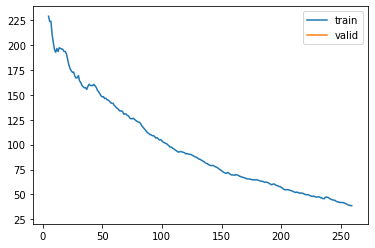

In [ ]:
learn_Aa48_nc.recorder.plot_loss()

In [ ]:
torch.save(learn_Aa48_nc.model, "trained_4_feb_All_gap_all_48_no_control_v1.pickle")

In [ ]:
show_results(learn_Aa48_nc, items=items_Aa48_nc, control_map=control_map)

[MeteoImpItem(i=3077, shift=-35, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=12), MeteoImpItem(i=3195, shift=-35, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=12), MeteoImpItem(i=3230, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=12), MeteoImpItem(i=2910, shift=0, var_sel=['TA', 'SW_IN', 'VPD', 'PA', 'P', 'WS', 'LW_IN'], gap_len=12)]


alt.HConcatChart(...)

## LW_IN - gap 12

In [ ]:
dls_LW_IN = imp_dataloader(haiB, hai_eraB, var_sel = 'LW_IN', block_len=50, gap_len=12, bs=20, control_lags=[1], n_rep=5).cpu()

In [ ]:
model_LW_IN = model_Av.copy()

In [ ]:
save_models_LW_IN = SaveModelsBatch(times_epoch=10)

In [ ]:
items_LW_IN = random.choices(dls_LW_IN.valid.items, k=4)

In [ ]:
learn_LW_IN = Learner(dls_LW_IN, model_LW_IN, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_LW_IN], metrics=rmse_gap)

In [ ]:
learn_LW_IN.fit(1, 1e-3)

epoch,train_loss,valid_loss,rmse_gap,time
0,3.196418,3.997740,0.280681,11:39


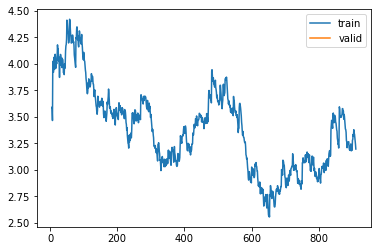

In [ ]:
learn_LW_IN.recorder.plot_loss()

In [ ]:
torch.save(learn_LW_IN.model, "trained_4_feb_LW_IN_gap_12_v1.pickle")

In [ ]:
show_results(learn_LW_IN, items = items_LW_IN, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=4462, shift=15, var_sel=['LW_IN'], gap_len=12), MeteoImpItem(i=4415, shift=5, var_sel=['LW_IN'], gap_len=12), MeteoImpItem(i=4322, shift=15, var_sel=['LW_IN'], gap_len=12), MeteoImpItem(i=4212, shift=-5, var_sel=['LW_IN'], gap_len=12)]


alt.HConcatChart(...)

### LW_IN - 96

after the first trainig fine tune the model for longer gaps 

In [ ]:
dls_LW_IN96 = imp_dataloader(haiB, hai_eraB, var_sel = 'LW_IN', block_len=300, gap_len=96, bs=20, control_lags=[1], n_rep=5).cpu()

In [ ]:
model_LW_IN96 = model_LW_IN.copy()

In [ ]:
save_models_LW_IN96 = SaveModelsBatch(times_epoch=5)

In [ ]:
items_LW_IN96 = random.choices(dls_LW_IN96.valid.items, k=4)

In [ ]:
learn_LW_IN96 = Learner(dls_LW_IN96, model_LW_IN96, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models_LW_IN96], metrics=rmse_gap)

In [ ]:
show_results(learn_LW_IN96, items = items_LW_IN96, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=634, shift=-90, var_sel=['LW_IN'], gap_len=96), MeteoImpItem(i=735, shift=-30, var_sel=['LW_IN'], gap_len=96), MeteoImpItem(i=651, shift=-150, var_sel=['LW_IN'], gap_len=96), MeteoImpItem(i=627, shift=-90, var_sel=['LW_IN'], gap_len=96)]


alt.HConcatChart(...)

In [ ]:
learn_LW_IN96.fit(1, 1e-4)

epoch,train_loss,valid_loss,rmse_gap,time
0,51.693777,57.928376,0.419843,21:42


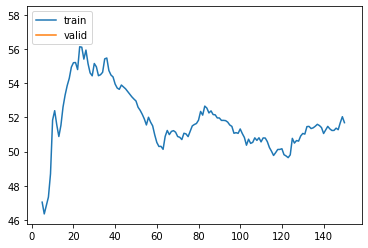

In [ ]:
learn_LW_IN96.recorder.plot_loss()

In [ ]:
show_results(learn_LW_IN96, items = items_LW_IN96, control_map = control_map, hide_no_gap=True)

[MeteoImpItem(i=634, shift=-90, var_sel=['LW_IN'], gap_len=96), MeteoImpItem(i=735, shift=-30, var_sel=['LW_IN'], gap_len=96), MeteoImpItem(i=651, shift=-150, var_sel=['LW_IN'], gap_len=96), MeteoImpItem(i=627, shift=-90, var_sel=['LW_IN'], gap_len=96)]


alt.HConcatChart(...)

In [ ]:
torch.save(learn_LW_IN96.model, "trained_4_feb_LW_IN_gap_96_v1.pickle")

## Conditional

In [ ]:
dls3 = imp_dataloader(haiB, haiB, var_sel = gen_var_sel(list(haiB.columns)), block_len=100, gap_len=10, bs=20, control_lags=[1], n_rep=10).cpu()

In [ ]:
model3 = KalmanFilterSR.init_local_slope_pca(len(haiB.columns),len(haiB.columns), df_pca = None, pred_only_gap=True, use_conditional=True)

In [ ]:
save_models3 = SaveModelsBatch(times_epoch=1) # save once per repetition

In [ ]:
items = random.choices(dls3.valid.items, k=4)

In [ ]:
learn3 = Learner(dls3, model3, KalmanLoss(only_gap=True), cbs = [Float64Callback, save_models2], metrics=rmse_gap)

In [ ]:
learn3.fit(20, 1e-4)

In [ ]:
learn3.recorder.plot_loss()

In [ ]:
torch.save(learn3.model, "trained_2_feb_gap_partial_var_cond_v1.pickle")

In [ ]:
# learnB.export("trained_2_feb_gap_all_var_v1")

In [ ]:
show_results(learn3, items=items)